# Ornstein-Uhlenbeck Process on the 2D Sphere

En este notebook vamos a generalizar las rutinas para actualizar al sistema

In [1]:
import time

In [2]:
1+1

2

In [3]:
# coding: utf-8
import numpy as np
from matplotlib import pyplot as plt
def orto(x):
    if np.dot(x,x) == 0:
        return 'No se puede: ese es el vector cero!'
    else:
        if 0 not in x:
            v1 = 1
            v2 = -(x[0]/x[1])
            v3 = 0
            #return np.array([v1,v2,v3])
        else:
            if x[0] == 0:
                if x[1] == 0:
                    v1 = 1
                    v2 = 0
                    v3 = 0
                else:
                    v1 = 0
                    v2 = 0
                    v3 = 1
            elif x[1] == 0:
                v1 = 0
                v2 = 1
                v3 = 0
            else:
                v1 = 0
                v2 = 0
                v3 = 1
        return np.array([v1,v2,v3])
    
#Funcion que regresa dos vectores; numpy arrays de 3D, ortogonales al vector de input x.
#Esto es, devuelven la base al espacio ortogonal definido por el vector x de entrada.
#@jit
def base_ort_nor(x):
    y = orto(x)
    v1 = y/np.linalg.norm(y)
    z = np.cross(x,v1)
    v2 = z/np.linalg.norm(z)
    return v1, v2


#Esta funcion genera un vector con distrubucion uniforme en las direcciones sobre un plano tangente a la esfera de radio R.
#@jit
def vector_des(v1,v2):
    na = 2*np.pi*np.random.rand()
    vn = v1*np.cos(na) + v2*np.sin(na)
    return vn/np.linalg.norm(vn)

R = 1

#Normalizamos al vector de desplazamiento para que intersecte al vector de la nueva posicion de acuerdo con que el
#desplazamiento (s) sobre la esfera, sobre este arco de circulo maximo, sea el determinado por el movimiento browniano particular.
#@jit
def vector_q(x,s):
    q = (R)*np.tan(s/(R))
    return q*x

#Dados todos los datos anteriores, esta funcion actualiza la posicion de la particula.
#Lo que hace es que la mueve sobre el plano tangente a la esfera en la direccion predeterminada de tal suerte que el desplazamiento efectivo
#s sobre una geodesica de la esfera, se el deseado, y posteriormente la proyecta sobre la superficie de la esfera.
#@jit
def nuevo_r(r, vector_q):
    y = r + vector_q
    y = y/np.linalg.norm(y)
    return (R)*y

#funcion que incorpora el efecto de un campo externo



#Esta funcion ensambla todo lo anterior: como imput necesita una posicion inicial y un arco de desplazamiento
#Como output da un vector de posicion nuevo dada un tipo de desplazamiento.
#@jit
def actualiza(r,s):
    v1, v2 = base_ort_nor(r)
    pre_q = vector_des(v1,v2)
    q = vector_q(pre_q, s)
    return nuevo_r(r, q)




#Esta funcion actualiza la posicion de todos los elementos de una lista; particula brownianas.
#@jit


def act_n(lista, D, delta_t):
    l = []
    for v in lista:
        s = ese(D,delta_t)
        l.append(actualiza(v,s))
    return l



#Huella de la trayectoria
#La siguiente funcion hace una particion de la trayectoria sobre s en n pedazos y regresa
#una lista de los vectores de esas posiciones sobre la esfera.
#Usa al operador de rotacion.

#@jit
def b_steps_(ri,rf,n):
    l = [ri]
    r0 = ri
    lamb = (np.dot(ri,rf))/((np.linalg.norm(ri))*(np.linalg.norm(rf)))
    
    if abs(lamb) > 1:
        #print 'Is fucked up: there was a rounding '
        if lamb < 0:
            lamb = -1
        else:
            lamb = 1
    
    
    
    theta = np.arccos(lamb)
    #if theta < 1e17:
        #return l
    if theta == 0:
        return [ri,rf]
    
    else:

        normal = np.cross(ri, rf)/ np.linalg.norm(np.cross(ri,rf))
        for i in range(1,n + 1):
            #vi = rot_theta(r0, theta/n, normal)
            vi = rot_finita(r0, -normal, theta/n)
            l.append(vi)
            r0 = vi
        return l


#Operador de Rotacion
#Depende de los parametros r, el vector o punto que queremos rotar; theta el angulo de rotacion; n el vector que define el eje de rotacion y el signo de rotacion.


#@jit
def rot_theta(r, theta, u):
    x = np.array([np.cos(theta) + (u[0]*u[0])*(1 - np.cos(theta)), u[0]*u[1]*(1 - np.cos(theta)) - u[2]*np.sin(theta), u[0]*u[2]*(1 - np.cos(theta)) + u[1]*np.sin(theta)])
    y = np.array([u[1]*u[0]*(1 - np.cos(theta)) + u[2]*np.sin(theta), np.cos(theta) + u[1]*u[1]*(1 - np.cos(theta)), u[1]*u[2]*(1 - np.cos(theta)) - u[0]*np.sin(theta)])
    z = np.array([u[2]*u[0]*(1 - np.cos(theta)) - u[1]*np.sin(theta), u[2]*u[1]*(1 - np.cos(theta)) + u[0]*np.sin(theta), np.cos(theta) + u[2]*u[2]*(1 - np.cos(theta))])
    R = np.array([x,y,z])
    return np.dot(R, r)



#Transformacion de coordenada de esfericas a cartesianas.

#@jit
def trans_s_c(r,theta, phi):
    x = r*np.sin(theta)*np.cos(phi)
    y = r*np.sin(theta)* np.sin(phi)
    z = r*np.cos(theta)
    return x, y, z



#def trans_c_s(x,y,z):
#    r = np.sqrt(x**2 + y**2 + z**2)
    #print r
#    cociente = z/r
#    if abs(cociente) > 1:
#        if cociente < 0:
#            theta = np.arccos(-1)
#        else:
#            theta = np.arccos(1)
#    else:
#        
#        theta = np.arccos(z/r)
    #Aqui hay un problema relevante: cada vez que y o x sean nulos, habra un problema
    #de indefinicion de operacion
#    if x == 0.:
#        if y == 0.:
#            phi = 2*np.pi*np.random.rand()
#    else:
#        if x < 0:
#            phi = np.arctan(y/x) + np.pi
#        else:
#            if y < 0:
#                phi = np.arctan(y/x) + 2*np.pi
#            else:
                
#                phi = np.arctan(y/x)
#    return r, theta, phi




# Version mas reciente (26 de marzo del 2018)

def trans_c_s(x,y,z):
    r = np.sqrt(x**2 + y**2 + z**2)
    #print r
    cociente = z/r
    if abs(cociente) > 1:
        #print "cociente mayor a 1"
        if cociente < 0:
            theta = np.arccos(-1)
            #print "cociente negativo", theta
        else:
            theta = np.arccos(1)
            #print theta
    else:
        
        theta = np.arccos(z/r)
        #print theta
    #Aqui hay un problema relevante: cada vez que y o x sean nulos, habra un problema
    #de indefinicion de operacion
    if x == 0.:
        #print "x=0"
        if y == 0.:
            #print "y=0"
            phi = 2*np.pi*np.random.rand()
        else:
            if y > 0:
                phi = np.pi/2
            else:
                phi = -np.pi/2
    else:
        
        if x < 0:
            #print "x<0"
            phi = np.arctan(y/x) + np.pi
        else:
            #print "x debería ser positivo"
            if y < 0:
                #print "y<0 tambien!"
                phi = np.arctan(y/x) + 2*np.pi
            else:
                #print "x<0 pero y>0"
                phi = np.arctan(y/x)
            
    return r, theta, phi







#Base unitaria para las coordenadas esféricas
#@jit
def r_uni(theta, phi):
    x = np.sin(theta)*np.cos(phi)
    y = np.cos(theta)*np.cos(phi)
    z = np.cos(theta)
    return np.array([x,y,z])
#@jit
def theta_uni(theta, phi):
    x = np.cos(theta)*np.cos(phi)
    y = np.cos(theta)*np.sin(phi)
    z = -np.sin(theta)
    return np.array([x,y,z])
#@jit
def phi_uni(theta, phi):
    x = -np.sin(phi)
    y = np.cos(phi)
    z = 0
    return np.array([x,y,z])

#Función que normaliza los nombres para las animaciones de tal suerte que tenga el mismo número de
#digitos y se iteren en orden
#@jit
def nombre(s):
    diferencia = 4 - len(str(s))
    ceros = '' 
    for i in range(diferencia):
        ceros = ceros + '0'
    variable = ceros + str(s)
    return variable

#Varianza para una distribucion bigaussiana; difusion en 2D
#@jit
def var(D, delta_t):
    return 4*D*delta_t


#Arco de circulo maximo con distribucion normal alrededor de cero y una varianza dada por
#@jit
def ese(D,delta_t):
    return abs(np.random.normal(loc = 0., scale = np.sqrt(var(D,delta_t)),size = None))

#Funcion de rotacion finita
#@jit
def rot_finita(r_ini, N, Phi):
    n = N/np.linalg.norm(N)
    r_fin = np.cos(Phi)*r_ini + (np.dot(n,r_ini))*(1 - np.cos(Phi))*n + (np.sin(Phi))*(np.cross(r_ini,n))
    return r_fin


#Funcion que regresa una lista de n numpy arrays que son l
def Trayectoria(ri,rf,n):
    l = [ri]
    r0 = ri
    theta = np.arccos((np.dot(ri,rf))/((np.linalg.norm(ri))*(np.linalg.norm(rf))))
    N = np.cross(ri, rf)
    
    for i in range(1,n + 1):
        vi = rot_finita(r0, N, theta/n)
        l.append(vi)
        r0 = vi
    return l

#Collision_check es una función que, dada una trayectoria: una lista de vectores que
#pasan por puntos sucesivos de la trayectoria, verifica si alguna de estas posiciones
#interesecto a alguno de los obstáculos. En caso de que así sea, actualiza conforme una
#colision elastica. En caso de no intersectar a ningun obstaculo regresa una lista
#con dos vectores: posicion inicial y posicion final en ese orden.
#@jit
def penetrate_obs(lista_vect, lista_obs, size):
    metiches = []
    for obs in lista_obs:
        theta_omega = size
        r_omega = obs
        frontera = .2
        #metiches = []
        for v in lista_vect:
            tamanho = np.cos(theta_omega - frontera)
            if np.dot(v,r_omega) > tamanho:
                print('Penetro el mother fucker obstacle')
                metiches.append(v)
                
            else:
                continue
    #print 'no choco el mother fucker'
    #valor = False
    return metiches


#Esta funcion cuando es llamada grafia la posicion de las partoculas brownianas.
#sobre la superficie de una esfera sobre la que se esta difundiendo.
#@jit
def plot_particles(lista, vpolar, vazim, numero):
    from mpl_toolkits.mplot3d import axes3d
    from mpl_toolkits.mplot3d import Axes3D
    from matplotlib import cm

    #import matplotlib.pyplot as plt
    #import numpy as np
    from itertools import product, combinations
    fig = plt.figure(figsize=(8,8))
    ax = fig.gca(projection='3d')
    ax.set_aspect("equal")
    ax._axis3don = False

    



    #draw sphere
    R = 1
    u, v = np.mgrid[0:2*np.pi:50j, 0:np.pi:50j]
    x=R*np.cos(u)*np.sin(v)
    y=R*np.sin(u)*np.sin(v)
    z=R*np.cos(v)
    #ax.plot_surface(x, y, z, color="r", alpha = 0.15)

    ax.plot_surface(x, y, z, cmap=cm.YlGnBu_r,rstride=1, cstride=1, alpha = 0.10, linewidth = 0.10)
    ax.view_init(vpolar, vazim)
    
    
    #draw an arrow or a set of arrow
    #ax.quiver(0,0,1.5,0,0,1, length=0.5, arrow_length_ratio = .5, color = "b")
    #ax.quiver(1.5,0,0,1,0,0, length=0.5, arrow_length_ratio = .5, color ="g")
    #ax.quiver(0,1.5,0,0,1,0, length=0.5, arrow_length_ratio = .5, color ="r")
    #draw patch
    #u, v = np.mgrid[0:2*np.pi:50j, 0:(np.pi/7):50j]
    #x=R*np.cos(u)*np.sin(v)
    #y=R*np.sin(u)*np.sin(v)
    #z=R*np.cos(v)
    #ax.plot_surface(x, y, z, color="r", alpha = 0.25)    
    
    #draw points
    for p in lista:
        ax.scatter([p[0]],[p[1]],[p[2]],color="b",s=15, alpha = 0.25)
    
    fig.savefig('KRAMERS_Field_Y01_Img{}.png'.format(nombre(numero)))
    ax.view_init(vpolar, vazim)
    plt.show()
    plt.close()

    
    
#@jit
def polo_n(n, R):
    l = []
    for i in range(n):
        l.append(np.array([0,0,R]))
    return l

#@jit
def particion_esfera(ccero, Nphi):
    Ntheta = int(4*np.pi/(ccero*Nphi))
    print('Ntheta', Ntheta, 'Nphi', Nphi, 'Ntheta*Nphi', Ntheta*Nphi)
    sigmaPhi = 2*np.pi/Nphi
    deltaphi = 2*np.pi/Nphi
    thetas = []
    phis = [0]
    cociente = ccero/sigmaPhi
    for i in range(Ntheta + 1):
        theta = np.arccos(1 - (i)*cociente)
        thetas.append(theta)
    for j in range(Nphi):
        phis.append(phis[j] + deltaphi)
    return thetas, phis

#@jit
def secuencia_part(tamini, Nfi, numero):
    l1, l2 = particion_esfera(4*np.pi/tamini, Nfi)
    particion = []
    for i in range(len(l2)):
        for j in range(len(l1)):
            x, y, z = trans_s_c(1, l1[j], l2[i])
            particion.append(np.array([x, y, z]))
            
    return plot_particles(particion, 45, 45, numero)

#Funcion que regresa las coordenadas del centro de dos arreglos para 
#las coordenadas theta y phi
#@jit
def coordenadas_centro(l1,l2):
    thetas_centro = []
    phis_centro = []
    for i in range(len(l1) - 1):
        theta_media = l1[i] + (l1[i + 1] - l1[i])/2.
        thetas_centro.append(theta_media)
    for j in range(len(l2) - 1):
        phi_media = l2[j] + (l2[j + 1] - l2[j])/2.
        phis_centro.append(phi_media)
    return thetas_centro, phis_centro

#@jit(nopython=True)
def secuencia_obs(N, Nfi, numero):
    l1_prima, l2_prima = particion_esfera(4*np.pi/N, Nfi)
    l1, l2 = coordenadas_centro(l1_prima, l2_prima)
    particion = []
    for i in range(len(l2)):
        for j in range(len(l1)):
            x, y, z = trans_s_c(1, l1[j], l2[i])
            particion.append(np.array([x, y, z]))
            
    print(len(particion))
    
    #return plot_particles(particion, 0, 0, numero)
    return particion


def plot_particle_traj_obs(lista_obstaculos, trayectoria,  vpolar, vazim, numero):
    from mpl_toolkits.mplot3d import axes3d
    from mpl_toolkits.mplot3d import Axes3D
    from matplotlib import cm

    #import matplotlib.pyplot as plt
    #import numpy as np
    from itertools import product, combinations
    fig = plt.figure(figsize=(20,10))
    ax = fig.gca(projection='3d')
    ax.set_aspect("equal")
    ax._axis3don = False
    

    



    #draw sphere
    R = 1
    u, v = np.mgrid[0:2*np.pi:50j, 0:np.pi:50j]
    x=R*np.cos(u)*np.sin(v)
    y=R*np.sin(u)*np.sin(v)
    z=R*np.cos(v)
    #ax.plot_surface(x, y, z, color="r", alpha = 0.15)

    ax.plot_surface(x, y, z, cmap=cm.YlGnBu_r,rstride=1, cstride=1, alpha = 0.10, linewidth = 0.15)
    ax.view_init(vpolar, vazim)
    #draw patch
    #u, v = np.mgrid[0:2*np.pi:50j, 0:(np.pi/7):50j]
    #x=R*np.cos(u)*np.sin(v)
    #y=R*np.sin(u)*np.sin(v)
    #z=R*np.cos(v)
    #ax.plot_surface(x, y, z, color="r", alpha = 0.25)
    
    
    
    #draw obstacles
    
    for p in lista_obstaculos:
        ax.scatter([p[0]],[p[1]],[p[2]], color="b", s=10, alpha = 0.2)
    
    #draw trajectory
    for p in trayectoria:
        ax.scatter([p[0]],[p[1]],[p[2]], color="k",s=20, alpha = 0.7)
    
    #Plot the x positive direction
    
    ax.quiver(1.5,0,0,1,0,0, length=0.5, arrow_length_ratio = .5)
    ax.quiver(0,1.5,0,0,1,0, length=0.5, arrow_length_ratio = .5)
    ax.quiver(0,0,1.5,0,0,1, length=0.5, arrow_length_ratio = .5)
    
    #fig.savefig('BS_24_Obs_test_01{}.png'.format(nombre(numero + 1)))
    #ax.view_init(80, 30)
    #plt.close()
    plt.show()

def obs_uniforme(N, R, size):
    
    list_obs = []
    omega = np.cos(size)
    while len(list_obs) < N:
        x, y, z = np.random.uniform(-1,1), np.random.uniform(-1,1), np.random.uniform(-1,1)
        v = np.array([x, y, z])
        norma = np.linalg.norm(v)
        if norma <= R:
            n = v/norma
            if not np.dot(n, np.array([0.,0.,1.]))/R > omega:
                list_obs.append(R*n)
    
    return list_obs    


def puntos_obs_j(r_omega, theta_omega, n):
    r , theta, phi = trans_c_s(r_omega[0],r_omega[1],r_omega[2])
    rp = rot_finita(r_omega, phi_uni(theta, phi), theta_omega)
    puntos_obs_j = [rp]
    for i in range(1,n):
        x = rot_finita(rp, r_omega, 2*np.pi/n)
        puntos_obs_j.append(x)
        rp = x
    return puntos_obs_j



def puntos_obs(lista_obstaculos, size):
    mis_obs = []
    for i in range(len(lista_obstaculos)):
        a = lista_obstaculos[i]
        b = size
        mis_obs = mis_obs + puntos_obs_j(a,b,100)
    return mis_obs
#Collision_check es una función que, dada una trayectoria: una lista de vectores que
#pasan por puntos sucesivos de la trayectoria, verifica si alguna de estas posiciones
#interesecto a alguno de los obstáculos. En caso de que así sea, actualiza conforme una
#colision elastica. En caso de no intersectar a ningun obstaculo regresa una lista
#con dos vectores: posicion inicial y posicion final en ese orden.

def penetrate_obs(lista_vect, lista_obs, size):
    metiches = []
    for obs in lista_obs:
        r_omega, theta_omega = obs, size
        #frontera = .2
        #metiches = []
        for v in lista_vect:
            tamanho = np.cos(theta_omega)
            if np.dot(v,r_omega) >= tamanho:
                #print 'Penetro el mother fucker obstacle'
                metiches.append(v)
                
            else:
                continue
    #print 'no choco el mother fucker'
    #valor = False
    return metiches
    

def check_collision(lista_vect, lista_obs, size):
    for obs in lista_obs:
        r_omega, theta_omega = obs, size 
        for v in lista_vect:
            tamanho = np.cos(theta_omega)
            if np.dot(v,r_omega) > tamanho:
                return  True
            else:
                continue
    return False
    

def vector_q(x,s):
    q = np.tan(s)
    return q*x

#Distribución en el polo sur

def polo_s(n, R):
    l = []
    for i in range(n):
        l.append(np.array([0,0,-R]))
    return l

#Dsitribución en el ecuador

def dist_ecuador(n):
    l = []
    for i in range(n):
        x, y, z = trans_s_c(1.,np.pi/2, np.random.uniform(0,2*np.pi))
        l.append(np.array([x,y,z]))
    return l



/Users/adrianovaldesgomez/anaconda3/lib/python3.7/site-packages/matplotlib/font_manager.py:232: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  'Matplotlib is building the font cache using fc-list. '


In [4]:
def nuevo_r_field(r, vector_q, field):
    #nfield = np.tan(field)
    xf = np.linalg.norm(field)
    if xf == 0:
        nfield = 0
    else:
        fvecuni = field/xf
        nfield = np.tan(xf)*fvecuni
    #y = r + vector_q + nfield
    y = r + vector_q + nfield
    y = y/np.linalg.norm(y)
    return y



coff = np.sqrt((3./(4*np.pi)))

def field_theta(ri, v0):
    r, theta, phi = trans_c_s(ri[0],ri[1],ri[2])
    
    theta_field = coff*(np.sin(theta))
    
    phi_field = 0.
    
    field = v0*(theta_field)*theta_uni(theta, phi)
    
    return field

def actualiza_field_theta(r,s,v0):
    v1, v2 = base_ort_nor(r)
    pre_q = vector_des(v1,v2)
    q = vector_q(pre_q, s)
    return nuevo_r_field(r, q, field_theta(r,v0))
    #return nuevo_r_field(r, pre_q, field_theta(r,v0))


def act_n_field(lista, v0):
    l = []
    for v in lista:
        s = ese(D,dt)
        l.append(actualiza_field_theta(v, s, v0))
    return l


## General Langevin Equation

In [5]:
#def fun_RandForce(pos_ini):
#    r,theta,phi = trans_c_s(pos_ini[0],pos_ini[1],pos_ini[2])   

In [6]:
1+1

2

In [7]:
def act_gLan(pos_ini, vel_ini, Ext_F, ud_rand_F, m, gamma, delta_t):
    
    vel_fin = vel_ini*(1 - (gamma/m)*delta_t) + ud_rand_F + Ext_F*delta_t
    
    if np.linalg.norm(vel_ini) > 0.:
        
        vel_fin = rot_finita(vel_fin, np.cross(vel_ini,pos_ini), np.linalg.norm(vel_ini*delta_t))

    s = np.linalg.norm(vel_ini*delta_t)
    
    #if s > 1e-8:
    if s > 0 and s < np.pi/2:
        
        uni_des = vel_ini*delta_t/s
    
        q = np.tan(s)
        pos_fin = pos_ini + q*uni_des
        pos_fin = pos_fin/np.linalg.norm(pos_fin)
    else:
        pos_fin = pos_ini
    #print(np.linalg.norm(pos_fin))
    return pos_fin, vel_fin

## Varianza en la velocidad

In [8]:
#Kb = 1.38665e-23
Kb = 1
T = 1.
#T = 300.
#m = 1.47217e-24
m=1
var_V = 2*Kb*T/m
D = 1.
#gamma = Kb*T/D

## Gamma $\gamma$

## Función que regresa una amplitud en la dispersión de la velocidad dada una normal

In [9]:
def ese_V(T, m, delta_t, gamma):
    sigma2 = 4*Kb*T*gamma*delta_t/m**2
    #sigma2 = var_V
    return abs(np.random.normal(loc=0., scale= np.sqrt(sigma2), size=None))

## Función que genera para cada posición $\bf{x}$ una fuerza estocástica en el plano tangente a la esfera en $\bf{x}$

In [10]:
def tangent_white_noise(x,delta_t,T,m,gamma):
    v1, v2 = base_ort_nor(x)
    s = ese_V(T,m,delta_t,gamma)
    return s*vector_des(v1,v2)

### Eureka!

In [11]:
%matplotlib inline

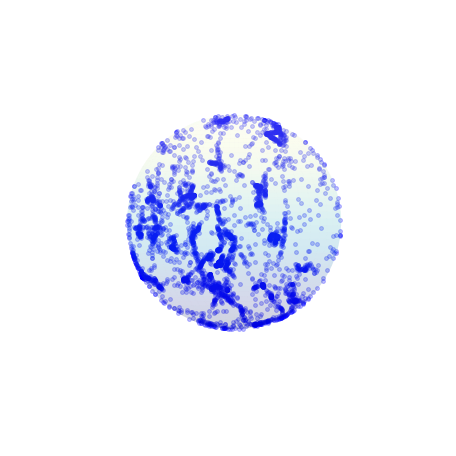

In [14]:
plot_particles(pos_t,0,0,1)

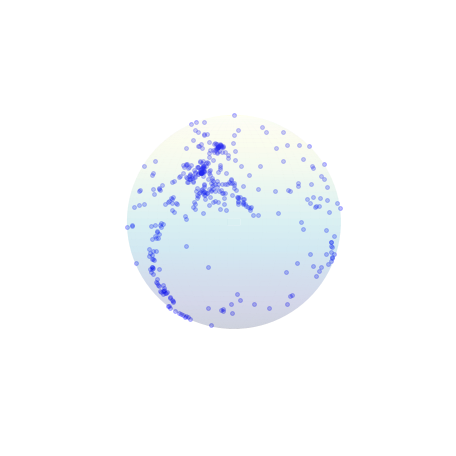

In [37]:
plot_particles(pos_t,0,0,1)

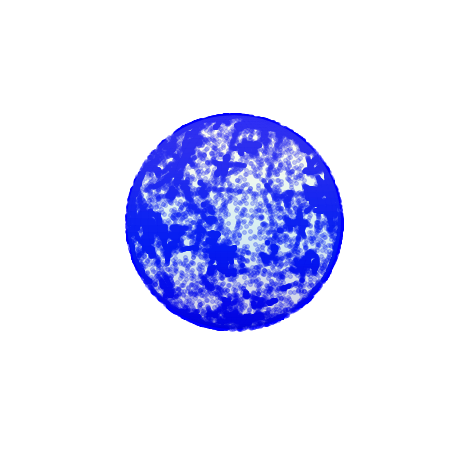

In [20]:
plot_particles(pos_t,0,0,1)

## Función que actualiza un ensamble de partículas

In [12]:
def act_ensamble(l_pos, l_vel, Ext_F, U0, m, T, gamma, delta_t):
    l_npos = []
    l_nvel = []
    for i in range(len(l_pos)):
        pos, vel = l_pos[i], l_vel[i]
        random_wn = tangent_white_noise(pos, delta_t, T, m, gamma)
        pos_fin, vel_fin = act_gLan(pos, vel, Ext_F(pos, U0), random_wn, m,gamma,delta_t)
        #print(Ext_F(pos, U0))
        l_npos.append(pos_fin)
        l_nvel.append(vel_fin)
    return l_npos, l_nvel

## Función que extrae los histogramas de theta y phi dada una lista de vectores de posición

In [13]:
def theta_phi(l_pos):
    thetas = []
    phis = []
    for pos in l_pos:
        r,theta, phi = trans_c_s(pos[0],pos[1],pos[2])
        thetas.append(theta)
        phis.append(phi)
    return thetas, phis

## Función que calcula los diferentes momentos de theta y phi para cada paso de tiempo

In [14]:
def momentos_theta(thetas):
    promedio = np.mean(thetas)
    varianza = np.var(thetas)
    return promedio, varianza

## Función que genera n velocidades iniciales aleatorias en el plano tangente al polo norte

In [15]:
def n_vel_ini(x,n,delta_t, T,m,inten,gamma):
    l_vel = []
    for i in range(n):
        l_vel.append(inten*tangent_white_noise(x,delta_t,T,m,gamma))
    return l_vel

## Simulaciones

In [15]:
import time

## Análisis de Datos

## SImulaciones variando gama

In [16]:
Kb = 13.8064852
m = 1.47216738
T = 300.
U0 = 50*np.sqrt(2*(Kb*T/gamma))

NameError: name 'gamma' is not defined

In [39]:
U0

287.8174963409973

In [20]:
!pwd

/Users/adrianovaldesgomez/Documents/Adriano_Programming


In [16]:
%cd KramersY10/

/Users/adrianovaldesgomez/Documents/Adriano_Programming/KramersY10


In [17]:
!pwd

/Users/adrianovaldesgomez/Documents/Adriano_Programming/KramersY10


In [34]:
start_time = time.time()

n_parti = 5000


#pos_ini = polo_n(n_parti, 1.)

pos_ini = obs_uniforme(n_parti, 1., 0)



#D = 1e-12

intensidad = 1.
delta_t = np.log(2)*1e-3
#gamma = Kb*T/D
gamma = 1000.
Kb = 13.8064852
m = 1.47216738
T = 300.
U0 = 20000*np.sqrt(2*(Kb*T/gamma))

l_pos_t = [pos_ini]

vel_ini = n_vel_ini(np.array([0,0,1.]), n_parti, delta_t, T, m, intensidad, gamma)
#vel_ini = [np.array([0,0,0]) for i in range(n_parti)]
thetas_ini = [0 for i in range(n_parti)]

thetas_histo_t = [thetas_ini]


theta_mean_t = [0]
#phis_mean = []
theta_var_t = [0]

mean_cos_thetas_t = [1]
#field_theta
for i in range(1000):
    pos_ini, vel_ini = act_ensamble(pos_ini, vel_ini, field_theta, U0, m, T, gamma, delta_t)
    l_pos_t.append(pos_ini)
    thetas, phis = theta_phi(pos_ini)
    thetas_histo_t.append(thetas)
    cos_thetas = np.cos(np.array(thetas))
    mean_cos_theta_t = np.mean(cos_thetas)
    mean, var = momentos_theta(thetas)
    theta_mean_t.append(mean)
    theta_var_t.append(var)
    mean_cos_thetas_t.append(mean_cos_theta_t)
    
np.savetxt("/Users/adrianovaldesgomez/Documents/Adriano_Programming/KramersY10/thetas_hist_t_gamma1e3.txt", thetas_histo_t)
np.savetxt("/Users/adrianovaldesgomez/Documents/Adriano_Programming/KramersY10/theta_mean_t_gamma1e3.txt", theta_mean_t)
np.savetxt("/Users/adrianovaldesgomez/Documents/Adriano_Programming/KramersY10/theta_var_t_gamma1e3.txt", theta_var_t)    
np.savetxt("/Users/adrianovaldesgomez/Documents/Adriano_Programming/KramersY10/mean_cos_theta_t_gamma1e3.txt", mean_cos_thetas_t)    


elapsed_time = time.time() - start_time
print(elapsed_time)

1974.6027328968048


In [64]:
#np.savetxt("C:/Users/MXI02006088A/OneDrive - AXA/01.WinDevice/Documents/Simulaciones_Ornstein/thetas_hist_t_gamma1.txt", thetas_histo_t)
#np.savetxt("C:/Users/MXI02006088A/OneDrive - AXA/01.WinDevice/Documents/Simulaciones_Ornstein/theta_mean_t_gamma1.txt", theta_mean_t)
#np.savetxt("C:/Users/MXI02006088A/OneDrive - AXA/01.WinDevice/Documents/Simulaciones_Ornstein/theta_var_t_gamma1.txt", theta_var_t)

In [28]:
#np.savetxt("/Users/adrianovaldesgomez/Documents/Adriano_Programming/KramersY10/thetas_hist_t_gamma1e3.txt", thetas_histo_t)
#np.savetxt("/Users/adrianovaldesgomez/Documents/Adriano_Programming/KramersY10/theta_mean_t_gamma1e3.txt", theta_mean_t)
#np.savetxt("/Users/adrianovaldesgomez/Documents/Adriano_Programming/KramersY10/theta_var_t_gamma1e3.txt", theta_var_t)    
#np.savetxt("/Users/adrianovaldesgomez/Documents/Adriano_Programming/KramersY10/mean_cos_theta_t_gamma1e3.txt", mean_cos_thetas_t)    

In [35]:
theta = np.linspace(0.0,np.pi,100)
y = (1/(2.))*np.ones(len(theta))*np.sin(theta)

In [71]:
plt.hist?

In [41]:
!pwd

/Users/adrianovaldesgomez/Documents/Adriano_Programming/KramersY10


In [42]:
!mkdir Kramers_Y10_Hist_theta_t

In [43]:
%cd Kramers_Y10_Hist_theta_t/

/Users/adrianovaldesgomez/Documents/Adriano_Programming/KramersY10/Kramers_Y10_Hist_theta_t


In [44]:
!pwd

/Users/adrianovaldesgomez/Documents/Adriano_Programming/KramersY10/Kramers_Y10_Hist_theta_t


/Users/adrianovaldesgomez/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


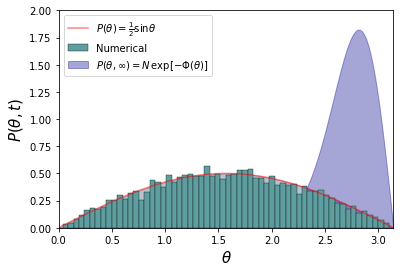

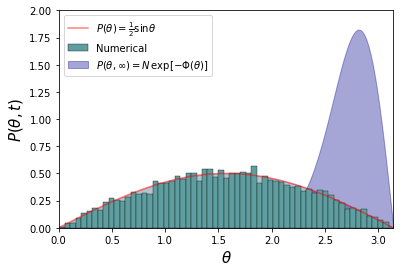

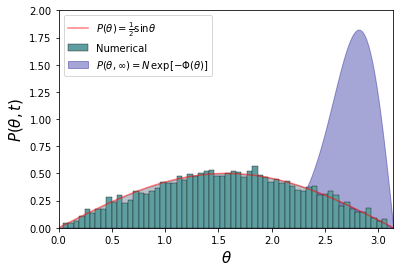

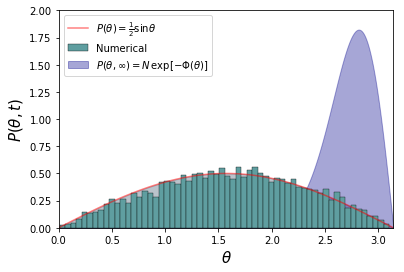

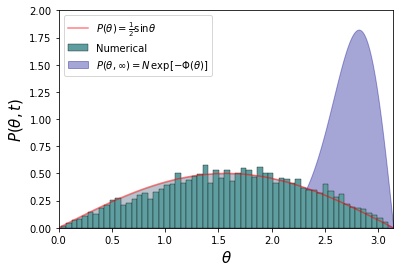

...

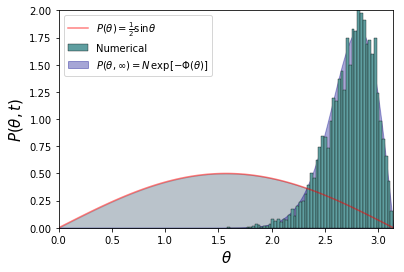

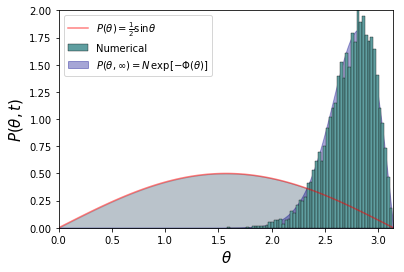

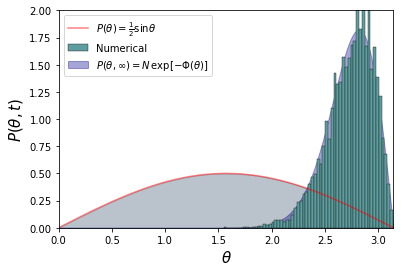

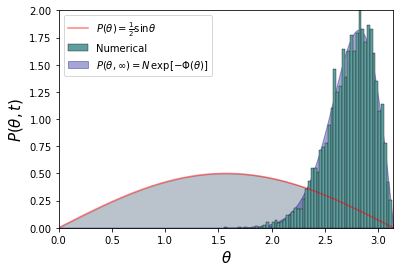

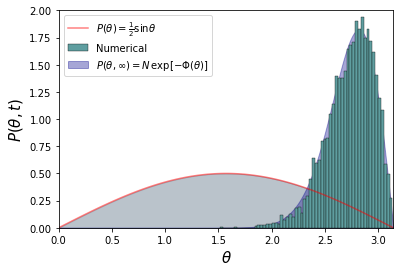

In [50]:
for i in range(1,200):
    fig = plt.figure()
    plt.plot(theta, y, 'r', label = r'$P(\theta) = \frac{1}{2} \sin{\theta}$', alpha = 0.5)
    plt.fill_between(theta, y ,y2 = 0, color = '#778899', alpha = .50)
    plt.hist(thetas_histo_t[1*i], bins=60, density=True, color = 'cadetblue', edgecolor='black', linewidth=.35, label='Numerical');
    plt.fill_between(xt, yt,y2 = 0, color = 'darkblue', alpha = .350, label=r'$P(\theta, \infty) = N \,\exp{[-\Phi(\theta)]}$')
    plt.xlabel(r'$\theta$', size=15)
    plt.ylabel(r'$P(\theta, t)$', size=15)
    plt.xlim(-1e-4,np.pi)
    plt.ylim(0,2)
    plt.legend(loc=2, fontsize = 10)
    fig.savefig('Kramers_Y10_Hist_theta_t{}.png'.format(nombre(i)), dpi=200)

In [51]:
!mencoder "mf://*.png" -o Kramers_SHY10_Animation_01.avi -ovc lavc -lavcopts vcodec=msmpeg4v2:autoaspect:vbitrate=2160000:mbd=2:keyint=132:vqblur=1.0:cmp=2:subcmp=2:dia=2:o=mpv_flags=+mv0:last_pred=3 -fps 20;


MEncoder 1.3.0-4.2.1 (C) 2000-2016 MPlayer Team
224 audio & 451 video codecs
success: format: 16  data: 0x0 - 0x0
MF file format detected.
[mf] search expr: *.png
[mf] number of files: 199 (1592)
[demux_mf] file type was not set! trying 'type=png'...
VIDEO:  [MPNG]  0x0  24bpp  25.000 fps    0.0 kbps ( 0.0 kbyte/s)
[V] filefmt:16  fourcc:0x474E504D  size:0x0  fps:25.000  ftime:=0.0400
Input fps will be interpreted as 20.000 instead.
libavcodec version 57.24.102 (internal)
Opening video filter: [expand osd=1]
Expand: -1 x -1, -1 ; -1, osd: 1, aspect: 0.000000, round: 1
Opening video decoder: [ffmpeg] FFmpeg's libavcodec codec family
Selected video codec: [ffpng] vfm: ffmpeg (FFmpeg PNG)
Could not find matching colorspace - retrying with -vf scale...
Opening video filter: [scale]
Movie-Aspect is undefined - no prescaling applied.
[swscaler @ 0x101edc410]bicubic scaler, from rgba to yuv420p using MMXEXT
videocodec: libavcodec (1200x800 fourcc=3234504d [MP42])
[VE_LAVC] High quality encodi

Pos:   1.9s     38f (19%) 13.94fps Trem:   0min   3mb  A-V:0.000 [2903:0]
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.format is not set
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.width or height is not set
Pos:   1.9s     39f (19%) 13.87fps Trem:   0min   3mb  A-V:0.000 [2896:0]
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.format is not set
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.width or height is not set
Pos:   2.0s     40f (20%) 13.99fps Trem:   0min   3mb  A-V:0.000 [2896:0]
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.format is not set
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.width or height is not set
Pos:   2.0s     41f (20%) 14.04fps Trem:   0min   3mb  A-V:0.000 [2888:0]
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.format is not set
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.width or height is not set
Pos:   2.1s     42f (21%) 14.03fps Trem:   0min   3mb  A-V:0.000 [2906:0]
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.format is not set
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.width or height is not set
Pos:   2.1s     43f (21%) 14.10fps Trem:   0min   3mb  A-V:0.000 [2910:0]
[

Pos:   4.2s     83f (41%) 14.87fps Trem:   0min   3mb  A-V:0.000 [2489:0]
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.format is not set
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.width or height is not set
Pos:   4.2s     84f (42%) 14.89fps Trem:   0min   2mb  A-V:0.000 [2483:0]
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.format is not set
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.width or height is not set
Pos:   4.2s     85f (42%) 14.92fps Trem:   0min   2mb  A-V:0.000 [2473:0]
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.format is not set
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.width or height is not set
Pos:   4.3s     86f (43%) 14.93fps Trem:   0min   2mb  A-V:0.000 [2463:0]
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.format is not set
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.width or height is not set
Pos:   4.3s     87f (43%) 14.93fps Trem:   0min   2mb  A-V:0.000 [2460:0]
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.format is not set
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.width or height is not set
Pos:   4.4s     88f (44%) 14.94fps Trem:   0min   2mb  A-V:0.000 [2466:0]
[

Pos:   8.6s    172f (86%) 15.60fps Trem:   0min   2mb  A-V:0.000 [2446:0]
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.format is not set
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.width or height is not set
Pos:   8.7s    173f (87%) 15.61fps Trem:   0min   2mb  A-V:0.000 [2443:0]
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.format is not set
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.width or height is not set
Pos:   8.7s    174f (87%) 15.63fps Trem:   0min   2mb  A-V:0.000 [2443:0]
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.format is not set
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.width or height is not set
Pos:   8.8s    175f (88%) 15.63fps Trem:   0min   2mb  A-V:0.000 [2445:0]
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.format is not set
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.width or height is not set
Pos:   8.8s    176f (88%) 15.60fps Trem:   0min   2mb  A-V:0.000 [2450:0]
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.format is not set
[msmpeg4v2 @ 0x101ec2fe0]AVFrame.width or height is not set
Pos:   8.8s    177f (89%) 15.57fps Trem:   0min   2mb  A-V:0.000 [2455:0]
[

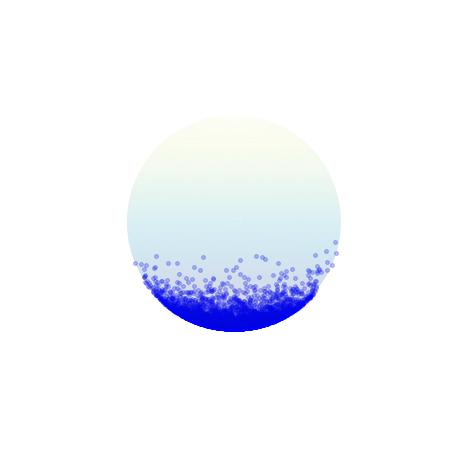

In [53]:
plot_particles(pos_ini, 0, 0, 1)

In [36]:
D = Kb*T/gamma

In [37]:
D

4.14194556

In [38]:
pot_Y10_int = -np.cos(theta)
coeff_pot_Y10 = np.sqrt(3./(4*np.pi))*2*U0/D
#p0_Y10_int = (1/9.70341e13)*np.exp(coeff_pot_Y10*pot_Y10_int)*np.sin(theta)
p0_Y10_int = (1./(3.723731e7))*np.exp(coeff_pot_Y10*pot_Y10_int)*np.sin(theta)
xpot_Y10 = np.linspace(0,np.pi,1000)
ypot_Y10 = np.sqrt(3./(4*np.pi))*np.cos(xpot_Y10)

Norm1 = 1159
D=1e-1
xt = np.linspace(0,np.pi,1000)
yt = (1./Norm1)*np.exp(-190*D*(np.sqrt(3./(4*np.pi)))*np.cos(xt))*np.sin(xt)

/Users/adrianovaldesgomez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in exp
  after removing the cwd from sys.path.


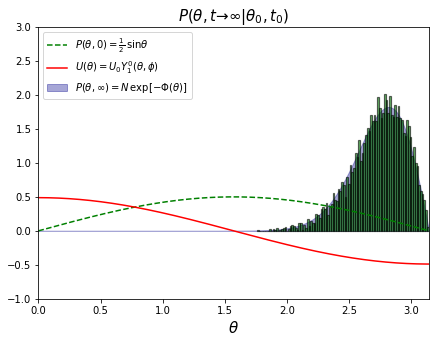

In [54]:
fig = plt.figure(figsize = (7,5))
ax = fig.add_subplot(111)
n,bins, rectangles = plt.hist(thetas_histo_t[-1], bins = 100, normed = True, color = "g", #
alpha = .59, edgecolor='black', linewidth=1.2)
fig.canvas.draw()
plt.xlabel(r"$\theta$", fontsize = 15)
#plt.ylabel(r"$P(\theta,t = t_0| \theta_0, t_0)$", fontsize = 18)
#plt.legend(loc = 1, fontsize = 14)
plt.title(r"$P(\theta,t \to \infty | \theta_0, t_0)$", fontsize = 15)
plt.plot(xpot_Y10, 0.5*np.sin(xpot_Y10), color = "g", linestyle = "--",label = r"$P(\theta,0) = \frac{1}{2}\,\sin{\theta}$")

#plt.plot(theta, p0_Y10_int, label=r'$P(\theta, \infty) = N \,\exp{[-\Phi(\theta)]}$')
plt.fill_between(xt, yt,y2 = 0, color = 'darkblue', alpha = .350, label=r'$P(\theta, \infty) = N \,\exp{[-\Phi(\theta)]}$')

#plt.fill_between(theta, p0_Y10_int ,y2 = 0, color = '#778899', alpha = .750, label=r'$P(\theta, \infty) = N \,\exp{[-\Phi(\theta)]}$')
plt.xlim(0,np.pi)
plt.ylim(-1,3)
plt.plot(xpot_Y10, ypot_Y10, color = "r", label = r"$U(\theta) =U_0 Y_{1}^{0}(\theta, \phi)$")
plt.legend(loc=2, fontsize = 10)
plt.savefig("Kramers-Y10_Hist_Theta_tinf", dpi = 250)
plt.show()

## Simulaciones con $\gamma = 10^{-3}$

C:\Ingresa\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


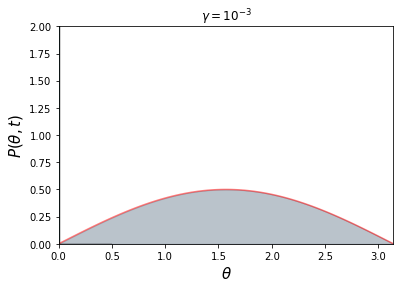

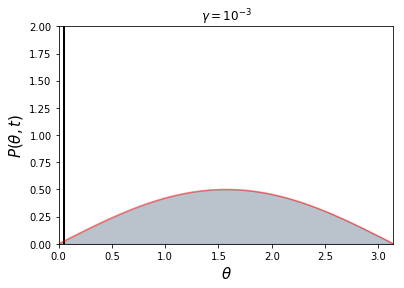

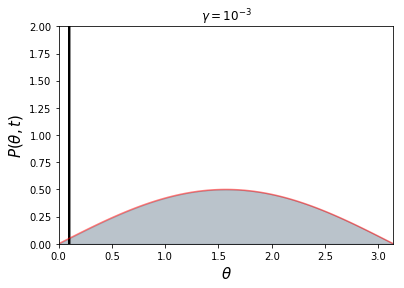

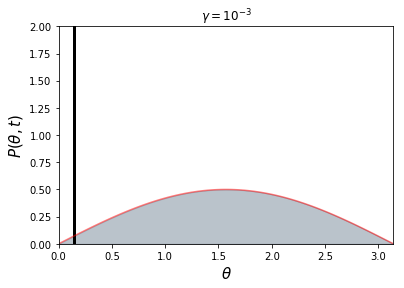

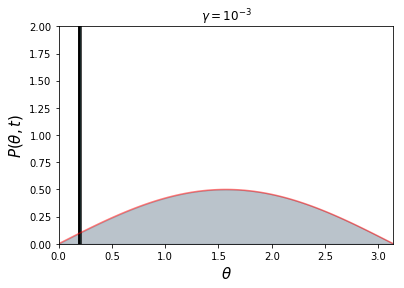

...

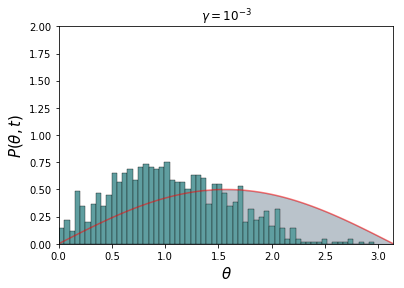

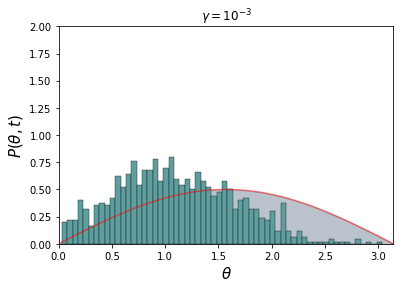

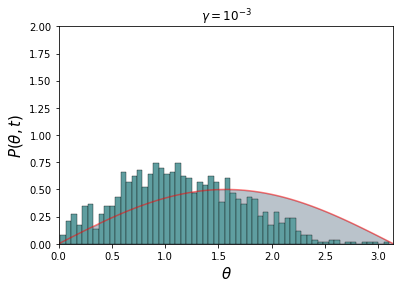

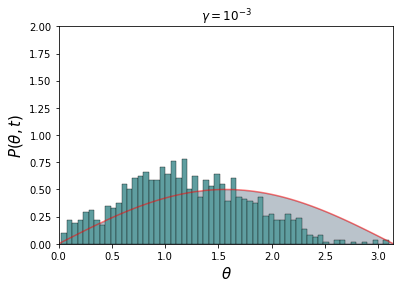

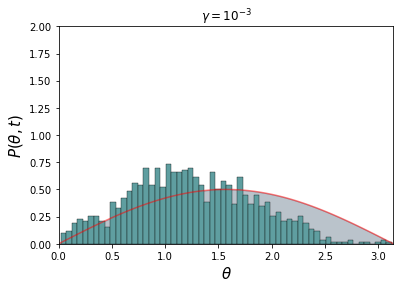

In [79]:
for i in range(150):
    fig = plt.figure()
    plt.plot(theta, y, 'r', label = r'$P(\theta) = \frac{1}{2} \sin{\theta}$', alpha = 0.5)
    plt.fill_between(theta, y ,y2 = 0, color = '#778899', alpha = .50)
    plt.hist(thetas_histo_t[5*i], bins=60, density=True, color = 'cadetblue', edgecolor='black', linewidth=.35);
    plt.xlabel(r'$\theta$', size=15)
    plt.ylabel(r'$P(\theta, t)$', size=15)
    plt.xlim(-1e-4,np.pi)
    plt.ylim(0,2)
    plt.title(r"$\gamma = 10^{-3}$")

## $\gamma= 0 $

C:\Ingresa\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


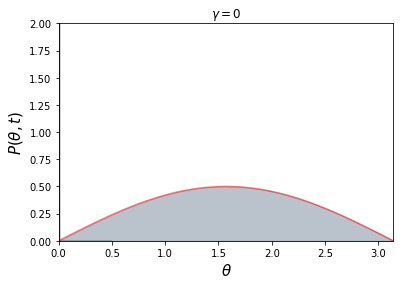

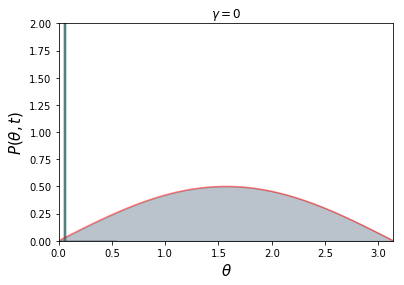

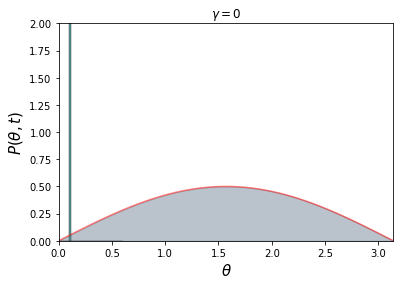

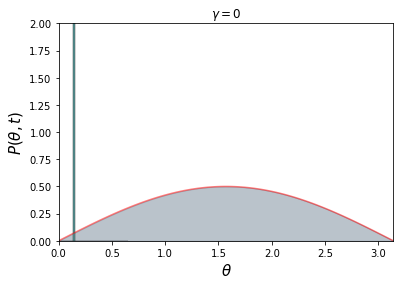

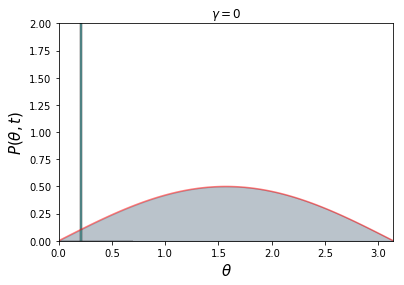

...

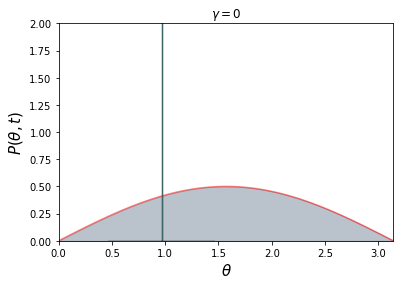

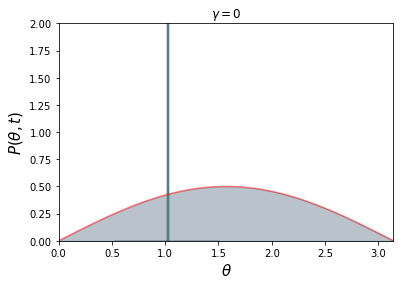

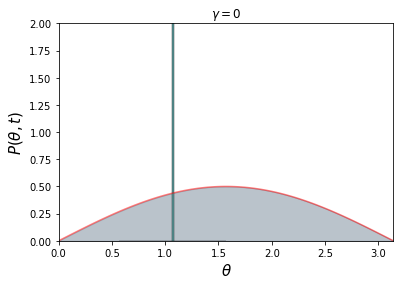

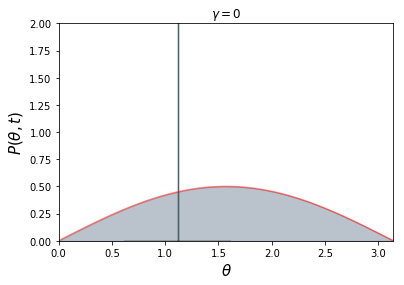

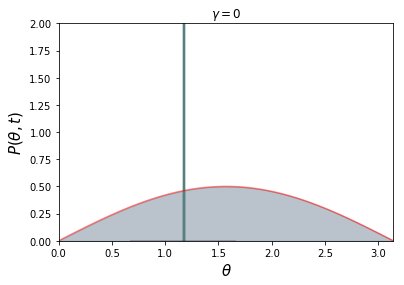

In [22]:
for i in range(150):
    fig = plt.figure()
    plt.plot(theta, y, 'r', label = r'$P(\theta) = \frac{1}{2} \sin{\theta}$', alpha = 0.5)
    plt.fill_between(theta, y ,y2 = 0, color = '#778899', alpha = .50)
    plt.hist(thetas_histo_t[5*i], bins=60, density=True, color = 'cadetblue', edgecolor='black', linewidth=.35);
    plt.xlabel(r'$\theta$', size=15)
    plt.ylabel(r'$P(\theta, t)$', size=15)
    plt.xlim(-1e-4,np.pi)
    plt.ylim(0,2)
    plt.title(r"$\gamma = 0$")

## $\gamma = 10$

C:\Ingresa\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


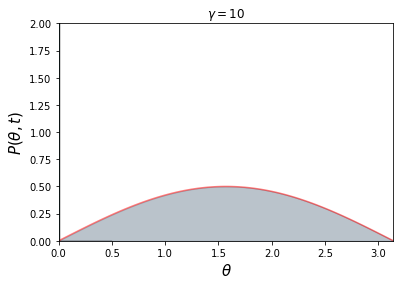

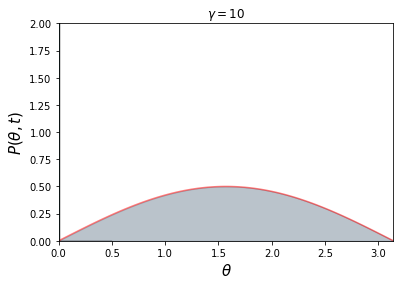

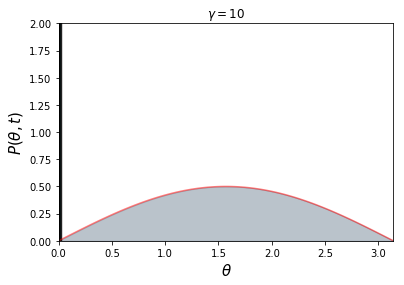

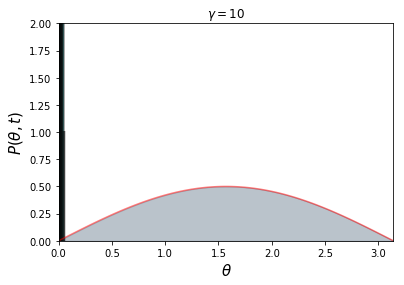

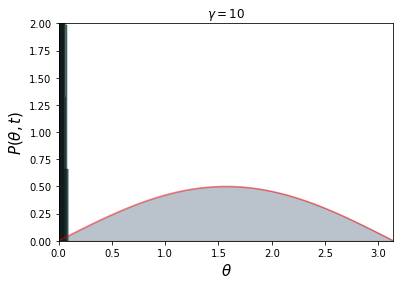

...

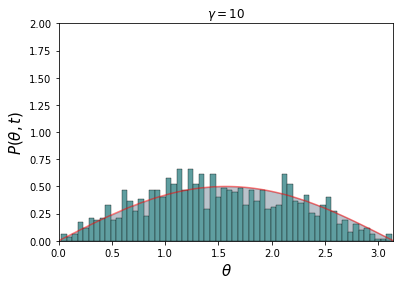

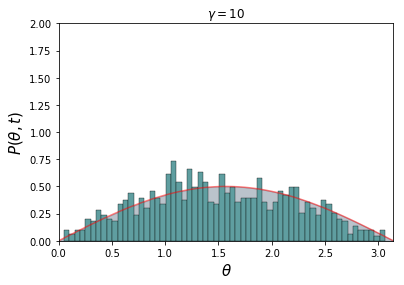

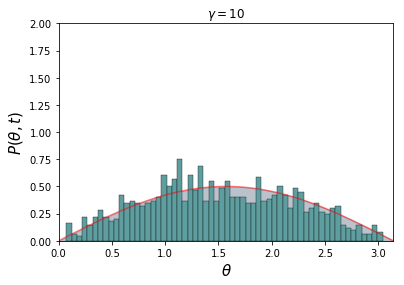

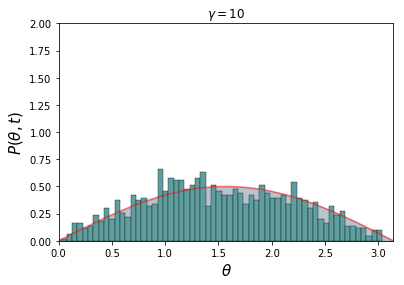

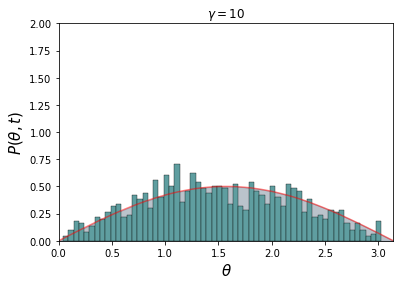

In [26]:
for i in range(150):
    fig = plt.figure()
    plt.plot(theta, y, 'r', label = r'$P(\theta) = \frac{1}{2} \sin{\theta}$', alpha = 0.5)
    plt.fill_between(theta, y ,y2 = 0, color = '#778899', alpha = .50)
    plt.hist(thetas_histo_t[1*i], bins=60, density=True, color = 'cadetblue', edgecolor='black', linewidth=.35);
    plt.xlabel(r'$\theta$', size=15)
    plt.ylabel(r'$P(\theta, t)$', size=15)
    plt.xlim(-1e-4,np.pi)
    plt.ylim(0,2)
    plt.title(r"$\gamma = 10$")

## $\gamma = 10^{3}$ Over Dampped regim

In [49]:
delta_t

0.001

In [50]:
def coeficiente(n,N):
    #N es el numero de pasos, por lo que el tiempo total transcurrido hasta ese momento es
    t = delta_t * N
    return ((2*n + 1.)/(4*np.pi)) * np.exp(-n*(n + 1)*D*t)

In [51]:
def distribucion(theta, N, orden):
    #lista = []
    c = np.zeros(orden)
    for n in range(orden):
        c[n] = coeficiente(n,N)
        #lista.append(coeficiente(n,N)*np.polynomial.legendre.legval(np.cos(theta), c))
    lista = np.polynomial.legendre.legval(np.cos(theta), c)
    #print lista
    #return sum(lista)
    return lista

In [52]:
def distribucion_weighted(theta, N, orden):
    #lista = []
    c = np.zeros(orden)
    for n in range(orden):
        c[n] = coeficiente(n,N)
        #lista.append(coeficiente(n,N)*np.polynomial.legendre.legval(np.cos(theta), c))
    lista = np.polynomial.legendre.legval(np.cos(theta), c)*np.sin(theta)*2*np.pi
    #print lista
    #return sum(lista)
    return lista

C:\Ingresa\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


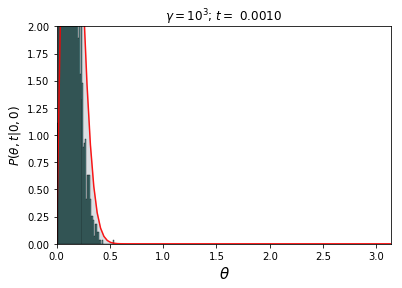

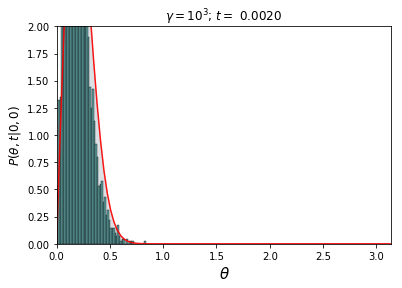

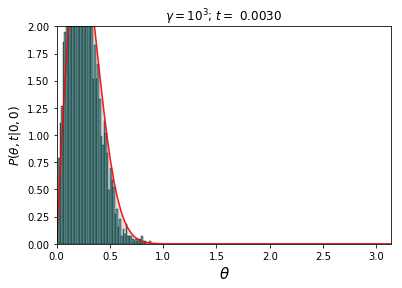

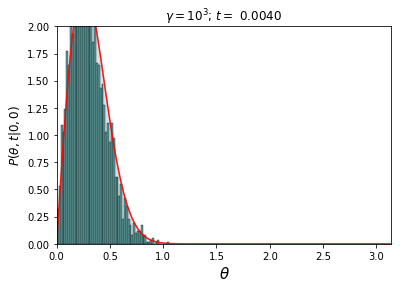

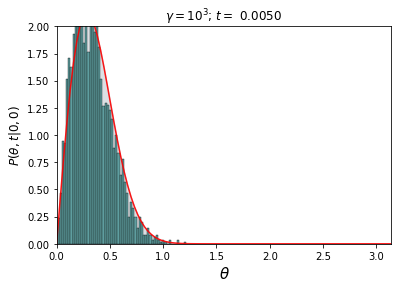

...

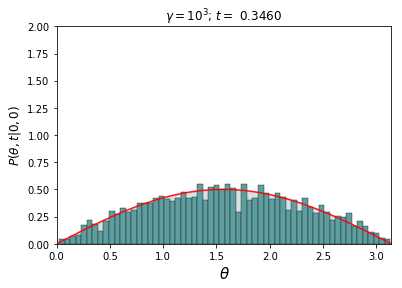

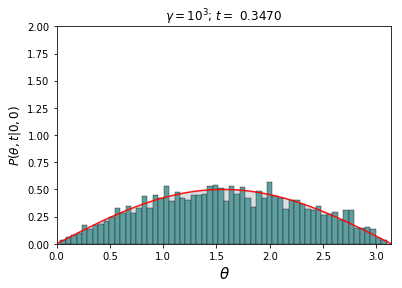

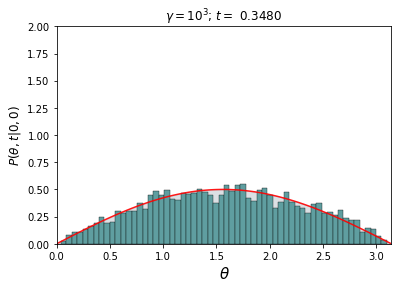

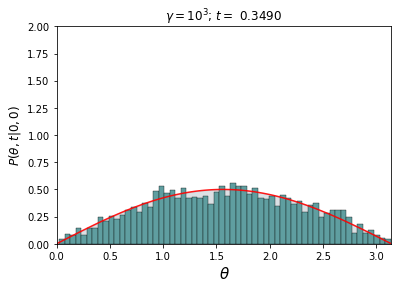

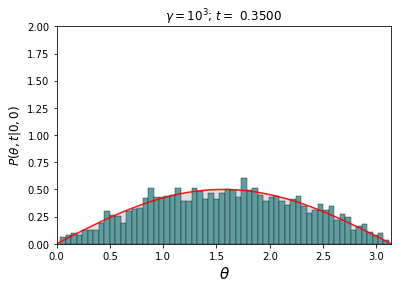

In [65]:
for i in range(1,351):
    t = i*delta_t
    fig = plt.figure()
    #plt.plot(theta, y, 'r', label = r'$P(\theta) = \frac{1}{2} \sin{\theta}$', alpha = 0.5)
    #plt.fill_between(theta, y ,y2 = 0, color = '#778899', alpha = .50)
    plt.hist(thetas_histo_t[2*i], bins=60, density=True, color = 'cadetblue', edgecolor='black', linewidth=.35);
    plt.fill_between(theta, distribucion_weighted(theta, 2*i, 100) ,y2 = 0, color = '#778899', alpha = .26)
    plt.plot(theta, distribucion_weighted(theta, 2*i, 100), color = 'r', alpha = .9)
    #plt.title("t = {} pasos".format(i))
    plt.ylim(0, 2)
    plt.xlim(0,np.pi+0.01)
    plt.xlabel(r"$\theta$ " , fontsize = 15)
    #plt.ylabel(r"$ \sin{\theta} \sum^{500} \frac{2n + 1}{2}\exp{-[n(n+1)Dt/R^2]P_{n}(\cos{\theta})}$", fontsize = 14)
    plt.xlabel(r'$\theta$', size=15)
    plt.ylabel(r'$ P(\theta, t |0 ,0)$', size=12)
    plt.xlim(-1e-4,np.pi)
    plt.ylim(0,2)
    plt.title(r"$\gamma = 10^{3}$; $t =$ %.4f" %round(t,4))

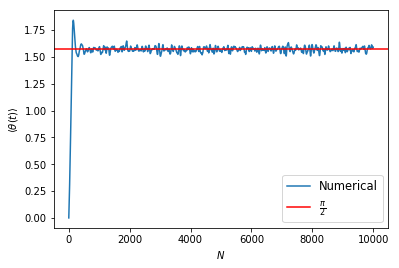

In [66]:
plt.plot(theta_mean_t, label='Numerical')
plt.axhline(np.pi/2, 0,25000, color='r', label = r'$\frac{\pi}{2}$')
plt.xlabel(r'$N$')
plt.ylabel(r'$\langle \theta(t) \rangle$')
plt.legend(loc = 4,fontsize=11.5);

Text(0.5,1,'$\\gamma = 10^{-3}$')

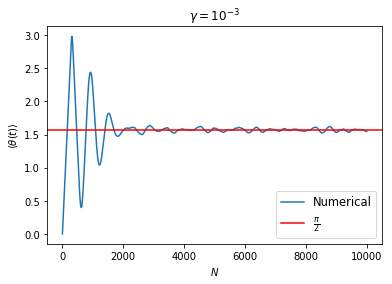

In [81]:
plt.plot(theta_mean_t, label='Numerical')
plt.axhline(np.pi/2, 0,25000, color='r', label = r'$\frac{\pi}{2}$')
plt.xlabel(r'$N$')
plt.ylabel(r'$\langle \theta(t) \rangle$')
plt.legend(loc = 4,fontsize=11.5);
plt.title(r"$\gamma = 10^{-3}$")

Text(0.5,1,'$\\gamma = 10^{-3}$')

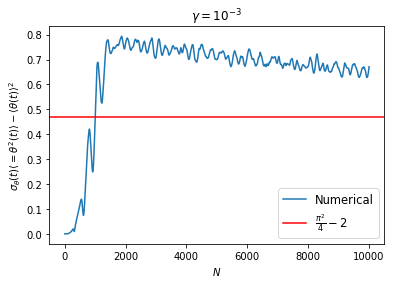

In [82]:
plt.plot(theta_var_t, label = 'Numerical')
plt.axhline(np.pi**2/4 - 2, 0,25000, color='r', label = r'$\frac{\pi^2}{4} - 2$')
plt.xlabel(r'$N$')
plt.ylabel(r'$\sigma_{\theta}(t)\langle = \theta^2(t) \rangle - \langle \theta(t) \rangle ^2$')
plt.legend(loc=4, fontsize=11.5)
plt.title(r"$\gamma = 10^{-3}$")

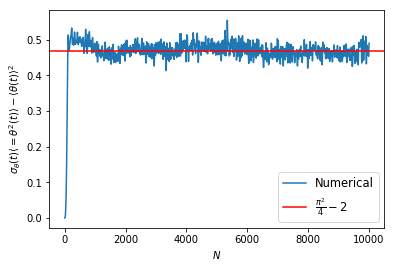

In [67]:
plt.plot(theta_var_t, label = 'Numerical')
plt.axhline(np.pi**2/4 - 2, 0,25000, color='r', label = r'$\frac{\pi^2}{4} - 2$')
plt.xlabel(r'$N$')
plt.ylabel(r'$\sigma_{\theta}(t)\langle = \theta^2(t) \rangle - \langle \theta(t) \rangle ^2$')
plt.legend(loc=4, fontsize=11.5)

In [22]:
times = [0]
t = 0.
for i in range(len(mean_cos_thetas_t) - 1):
    t += delta_t
    times.append(t)
times = np.array(times)

In [23]:
gamma

1000.0

In [24]:
D = Kb*T/gamma

In [25]:
D

4.14194556

In [69]:
len(times)

1001

In [70]:
len(mean_cos_thetas_t)

1001

In [71]:
y = np.exp(-2*D*times)

In [72]:
#mean_cos_thetas_t11 = np.loadtxt("C:\\Mean_cos_theta_t11.txt")

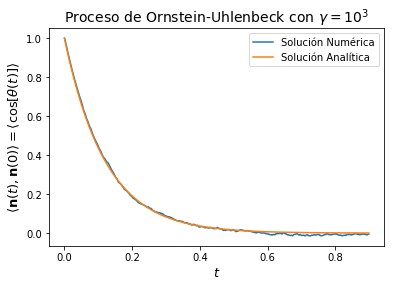

In [79]:
rango = 900
plt.plot(times[:rango],mean_cos_thetas_t[:rango], label = 'Solución Numérica')
plt.plot(times[:rango], y[:rango], label = 'Solución Analítica')
#plt.axhline(np.pi**2/4 - 2, 0,25000, color='r', label = r'$\frac{\pi^2}{4} - 2$')
plt.xlabel(r'$t$', size=13)
plt.ylabel(r'$\langle \mathbf{n}(t), \mathbf{n}(0)   \rangle =\langle \cos{[\theta(t)]} \rangle$', size=13)
plt.title(r"Proceso de Ornstein-Uhlenbeck con $\gamma = 10^{3}$", size = 14)
plt.legend(loc=1);

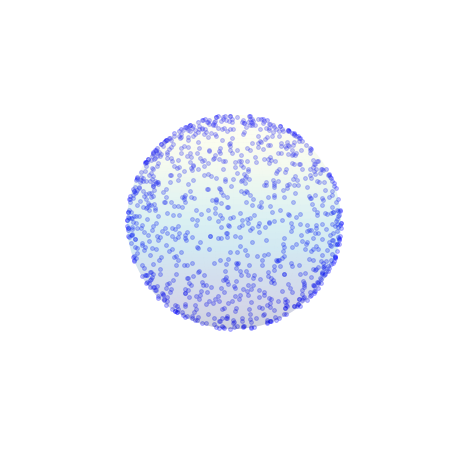

In [298]:
plot_particles(pos_ini, 0, 0, 1)

In [36]:
%pwd

'C:\\Users\\MXI02006088A\\Notebooks'

In [38]:
np.savetxt("theta_mean_t15.txt", theta_mean_t15)
np.savetxt("theta_var_t15.txt", theta_var_t15)
np.savetxt("Mean_cos_theta_t15.txt", mean_cos_thetas_t15)